<a href="https://colab.research.google.com/github/ntzo-ai/EKPA-exams/blob/main/ntzo_scenario_3596_c1_u2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Εντοπισμός περιεχομένου από δίκτυο Tor

#εγκατάσταση πακέτου pycaret (https://pycaret.org/)
!pip install pycaret
#εγκατάσταση πακέτου dataprep (https://dataprep.ai/)
!pip install dataprep
#***ΠΡΟΣΟΧΗ*** αν σας ζητηθεί επανεκκίνηση με σχετικό κόκκινο μήνυμα μετά την ολοκλήρωση της εγκατάστασης
#***πατήστε το κουμπί RESTART SESSION στο σχετικό μήνυμα

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 509.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached jedi-0.19.1-py2.py3-none-any.whl.metadata (22 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━

In [126]:
#εισαγωγή βιβλιοθηκών - πακέτων
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

In [31]:
#εισαγωγή του συνόλου δεδομένων
url = "https://raw.githubusercontent.com/kdemertzis/EKPA/refs/heads/main/Data/DarkNet.csv"
sf = pd.read_csv(url)
sf.shape

(68580, 83)

In [32]:
#οπτικοποίηση συνόλου δεδομένων
sf.head()

,Src_IP,Src_Port,Dst_IP,Dst_Port,Protocol,Flow_Duration,Total_Fwd_Packet,Total_Bwd_packets,Total_Length_of_Fwd_Packet,Total_Length_of_Bwd_Packet,...,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,Label-1,Label-2
0,10.152.152.11,57158,216.58.220.99,443,6,229,1,1,0,0,...,0,0,0,0,0,0.000,0,0,Non-Tor,AUDIO-STREAMING
1,10.152.152.11,57159,216.58.220.99,443,6,407,1,1,0,0,...,0,0,0,0,0,0.000,0,0,Non-Tor,AUDIO-STREAMING
2,10.152.152.11,57160,216.58.220.99,443,6,431,1,1,0,0,...,0,0,0,0,0,0.000,0,0,Non-Tor,AUDIO-STREAMING
3,10.152.152.11,49134,74.125.136.120,443,6,359,1,1,0,0,...,0,0,0,0,0,0.000,0,0,Non-Tor,AUDIO-STREAMING
4,10.152.152.11,34697,173.194.65.127,19305,6,10778451,591,400,64530,6659,...,0,0,0,0,1437760000000000,3117718.131,1437760000000000,1437760000000000,Non-Tor,AUDIO-STREAMING


In [115]:
df = sf.drop(['Src_IP', 'Dst_IP', 'Flow_Bytes/s', 'Label-2'], axis=1)
df.head()

,Src_Port,Dst_Port,Protocol,Flow_Duration,Total_Fwd_Packet,Total_Bwd_packets,Total_Length_of_Fwd_Packet,Total_Length_of_Bwd_Packet,Fwd_Packet_Length_Max,Fwd_Packet_Length_Min,...,Fwd_Seg_Size_Min,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,Label-1
0,57158,443,6,229,1,1,0,0,0,0,...,20,0,0,0,0,0,0.000,0,0,Non-Tor
1,57159,443,6,407,1,1,0,0,0,0,...,20,0,0,0,0,0,0.000,0,0,Non-Tor
2,57160,443,6,431,1,1,0,0,0,0,...,20,0,0,0,0,0,0.000,0,0,Non-Tor
3,49134,443,6,359,1,1,0,0,0,0,...,20,0,0,0,0,0,0.000,0,0,Non-Tor
4,34697,19305,6,10778451,591,400,64530,6659,131,0,...,20,0,0,0,0,1437760000000000,3117718.131,1437760000000000,1437760000000000,Non-Tor


ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'Total_Length_...ket'


DataPrep Report
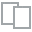
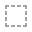
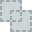
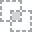
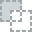
...
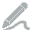
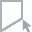
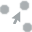
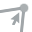
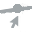

In [54]:
#Διερευνητική ανάλυση δεδομένων (Exploratory Data Analysis - EDA)
create_report(df)

In [116]:
# διαχωρισμός δεδομένων εκπαίδευσης και στόχου
X = df.iloc[:, :-1]  # όλες οι κολώνες/πεδία εκτός της τελευταίας
y = df.iloc[:, -1]   # τελευταία κολώνα/πεδίο

In [117]:
# εντοπισμός παραμέτρων κατηγορικών
categorical_cols = X.select_dtypes(include=['O']).columns

In [119]:
# Create a column transformer with one-hot encoding for the specified categorical features
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_cols)
    ],
    remainder='passthrough'
)


In [127]:
# δημιουργία σειράς βημάτων για την εκπαίδευση του μοντέλου, όπου πρώτα γίνεται το data tranformation
# και κατόπιν εφαρμόζεται ο αλγόριθμος logistic regression
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('imputer', SimpleImputer(strategy='mean')),
    ('classifier', LogisticRegression(max_iter=1000))
])


In [128]:
#διαχωρισμός των δεδομένων σε σύνολα εκπαίδευσης (train) και δοκιμών (test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [129]:
# έλεγχος για κενές τιμές
has_inf = np.any(np.isinf(X_train))

if has_inf:
    X_train.replace([np.inf, -np.inf], np.nan, inplace=True)


In [130]:
# εκπαίδευση του μοντέλου
pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat', OneHotEncoder(),
                                                  Index([], dtype='object'))])),
                ('imputer', SimpleImputer()),
                ('classifier', LogisticRegression(max_iter=1000))])

In [133]:
# έλεγχος για κενές τιμές
has_inf = np.any(np.isinf(X_test))

if has_inf:
    X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

In [134]:
# Αξιολόγηση του μοντέλου
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))

Accuracy: 53.52%
